# Simulating Catalyst models
We have previously shown how to perform basic ODE, SDE, and GIllespie simulations of Catalyst models. Here, we will show various more advanced simulations options.

## Basic solution interfacing and plotting

For this example we will use the oscillating "Brusselator" model. We create our model and simulate it.

In [1]:
using Catalyst, DifferentialEquations

In [2]:
brusselator = @reaction_network begin
    A, ∅ → X
    1, 2X + Y → 3X
    B, X → Y
    1, X → ∅
end

Model ##ReactionSystem#230
States (2):
  X(t)
  Y(t)
Parameters (2):
  A
  B

In [3]:
u0 = [:X => 1.0, :Y => 0.0]
tspan = (0.0, 50.0)
ps = [:A => 1.0, :B => 4.0]

bruss_oprob = ODEProblem(brusselator, u0, tspan, ps)
sol = solve(bruss_oprob)

retcode: Success
Interpolation: specialized 4th order "free" interpolation, specialized 2nd order "free" stiffness-aware interpolation
t: 131-element Vector{Float64}:
  0.0
  0.0002497501251245943
  0.002747251376370537
  0.01929767914575568
  0.05645207029688089
  0.11015391846282419
  0.1782935508107718
  0.26409921388212954
  0.366081685022099
  0.48537594822960073
  ⋮
 41.879063554642805
 42.70557419081236
 43.60671226450359
 44.576298855348625
 45.614504501324106
 46.728389544259805
 47.93819923491114
 49.308045267794135
 50.0
u: 131-element Vector{Vector{Float64}}:
 [1.0, 0.0]
 [0.999001685234067, 0.0009984394590874255]
 [0.9890934974786193, 0.01092152163130513]
 [0.9267330055780313, 0.07398628561007183]
 [0.8052647857590309, 0.20050683651375795]
 [0.6662343342611355, 0.35389800460008436]
 [0.5360600802562882, 0.511499205357847]
 [0.4234488127170646, 0.6690865916383474]
 [0.33837952615744726, 0.8176476060409615]
 [0.27991965171335426, 0.9588559882144202]
 ⋮
 [0.2407337968710656, 

If we wish to access the solution vector (all states of the simulation), we can simply use `sol.u`. similarily, `sol.t` gives us the time vector. If we want to access all `X` values, we can use `sol[:X]`:

In [4]:
sol[:X]

131-element Vector{Float64}:
 1.0
 0.999001685234067
 0.9890934974786193
 0.9267330055780313
 0.8052647857590309
 0.6662343342611355
 0.5360600802562882
 0.4234488127170646
 0.33837952615744726
 0.27991965171335426
 ⋮
 0.2407337968710656
 0.24635349223695724
 0.25314633505912565
 0.26141658533186324
 0.27170988063989365
 0.2850514652898224
 0.30368738302803877
 0.33448717529746735
 0.3580628630516264

We have previously show how to plot the solution using `plot(sol)`. The `plot` command takes various commands to customize the function. We can also use `idxs=:X` to e.g. plot only the value of `X`:

In [5]:
using Plots

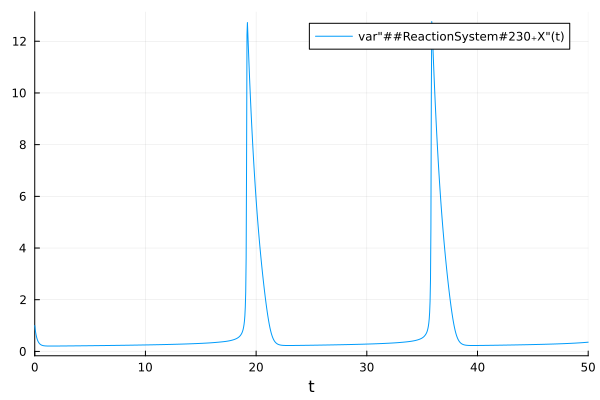

In [6]:
plot(sol; idxs=:X)

If we want to plot several species, we give these as a vector input (e.g. `idxs=[:X, :Y]`). By default, all species are plotted. We can plot the solution in phase space by instead using a "`Tuple`" (which uses `()` instead of `[]`):

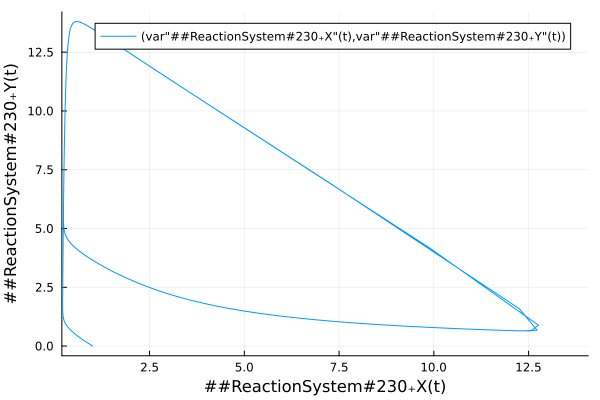

In [7]:
plot(sol; idxs=(:X, :Y))

## Simulation options
The `solve` command takes various arguments to e.g. specify solver adaptivity, time step sizing, and similar. It also allows you to specify a solver algorithm. When ana argument is not given, a default value will be found.

To e.g. specify that we wish to simulate the Brusselator using the stiff `Rodas5P` solver, we use:

In [8]:
solve(bruss_oprob, Rodas5P());

To read more about various solvers and options, refer to https://docs.sciml.ai/DiffEqDocs/stable/ (generally, https://docs.sciml.ai/Catalyst/stable/ contains extensive documentation on all features we will show, and also provide links to pages with additional documentation).

Especially when for Gillespie simulations of larger models, choice of algorithm is essential. Here we have performed benchmarks of various solvers, across various packages, for 5 different models (ranging from 9 to around 4,000 species). Let us consider the oscillating BCR model, when using the standard `Direct` method, we cannot even complete the simulation. However, Catalyst automatically generate the dependency graphs required to run the more performanct `RSSACR` algorithm. 

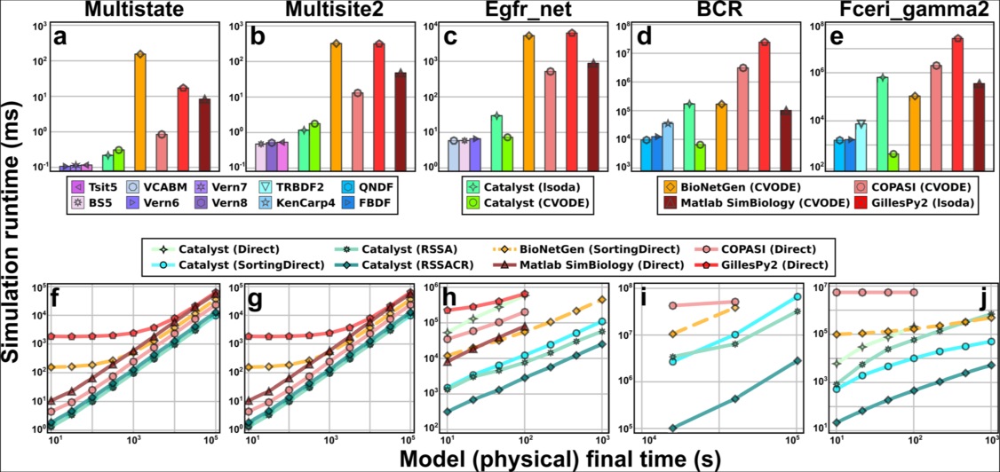

In [9]:
using Images
display(load("benchmark_figure.tif"))

(a-e) The time for the model to reach the steady state using a ODE simulation. 

(f-g) How the runtime for Gillespie-type simulation depend on the length of the simulation (in model time).

In fact, I am able to load up the 3,000 state BCR model and run a 500 time units on my laptop. We use the ReactionNetworkImporter package to load the model (as a .net file, SBML is also supported).

In [10]:
using ReactionNetworkImporters
BCR = loadrxnetwork(BNGNetwork(), "BCR.net")

Parsing parameters...done
Creating parameters...done
Parsing species...done


Creating species...done
Creating species and parameters for evaluating expressions...done


Parsing and adding reactions...

done
Parsing groups...done


ParsedReactionNetwork(ReactionSystem{Catalyst.NetworkProperties{Int64, SymbolicUtils.BasicSymbolic{Real}}}(Union{Equation, Reaction}[kf1, S2 + S1 --> S7, 2kp6c, 2*S2 --> S2 + S8, kp7c, S2 + S3 --> S2 + S9, kf9, S3 + S1 --> S10, 2kp14c, 2*S3 --> S9 + S3, kp15c, S2 + S3 --> S8 + S3, kf19a, S4 + S2 --> S11, kf21a, S4 + S3 --> S12, kf1, S8 + S1 --> S13, kr1, S7 --> S2 + S1  …  kdp28b, S1121 --> S1075, kdp28b, S1122 --> S1059, kdp29a, S1118 --> S1119, kdp29a, S1121 --> S1122, kdp29b, S1118 --> S974, kdp29b, S1119 --> S981, kdp29b, S1120 --> S987, kdp29b, S1121 --> S993, kdp29b, S1122 --> S998, kdp30a, S1120 --> S1119], Reaction[kf1, S2 + S1 --> S7, 2kp6c, 2*S2 --> S2 + S8, kp7c, S2 + S3 --> S2 + S9, kf9, S3 + S1 --> S10, 2kp14c, 2*S3 --> S9 + S3, kp15c, S2 + S3 --> S8 + S3, kf19a, S4 + S2 --> S11, kf21a, S4 + S3 --> S12, kf1, S8 + S1 --> S13, kr1, S7 --> S2 + S1  …  kdp28b, S1121 --> S1075, kdp28b, S1122 --> S1059, kdp29a, S1118 --> S1119, kdp29a, S1121 --> S1122, kdp29b, S1118 --> S974, kd

In [11]:
d_prob = DiscreteProblem(BCR.rn, BCR.u₀, (0.0, 500.0), BCR.p)                   # The reaction network, initial conditions, and parameters are stored in the `BCR` variable.
d_prob = remake(d_prob; u0=Int64.(d_prob.u0))                                   # The file format does not guarantee integer initial conditions, so this have to be fixed.
j_prob = JumpProblem(BCR.rn, d_prob, RSSACR(); save_positions=(false,false))    # We select the RSSACR algorithm. Do to the large number of jumps, `save_positions=(false,false)` is required to not fill the memory up.
sol = solve(j_prob, SSAStepper(); saveat=0.1);                                  # The argument `saveat=0.1` asks the solver to save the simulation at every 1. timestep.          

┌ Warning: Using arrays or dicts to store parameters of different types can hurt performance.
│ Consider using tuples instead.
└ @ SciMLBase /home/torkelloman/.julia/packages/SciMLBase/rpVRW/src/performance_warnings.jl:32


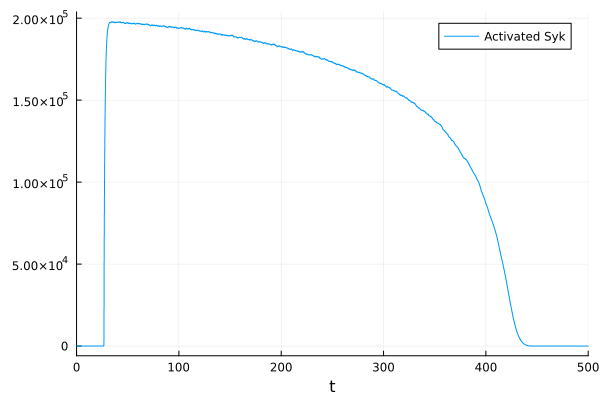

In [12]:
plot(sol, idxs=:Activated_Syk; label = "Activated Syk")

## Monte Carlo simulations
In certain situations, we want to carry out multiple simulations simultaneously. Example include making repeat simulations of a stochastic model, or simulating a model of several different initial conditions or parameter values. We can do this by creating an `EnsembleProblem`, which can then be simulated using various forms of parallelisation.

Let us consider a simple bistable switch model, and consider how the stochastic network randomly switches from an inactive state (where we set the initial condition) to an active state. First, we create a normal `SDEProblem`.

In [16]:
bistable_switch = @reaction_network begin
    v0 + hill(X,v,K,n), ∅ --> X
    deg, X --> ∅
end
u0 = [:X => 0.0]
tspan = (0.0,1000.0)
p = [:v0 => 0.1, :v => 2.5, :K => 75.0, :n => 2.0, :deg => 0.01]
sprob = SDEProblem(bistable_switch, u0, tspan, p);

Next, we supply our `SDEProblem` to an `EnsembleProblem`. Here, since we wish to simulate the same SDE repeatedly, it is the only input to our problem. However, if we e.g. would like to use different initial conditions for every simualtion, this information is also supplied here.

In [17]:
eprob = EnsembleProblem(sprob);

Finally, we can perform monte carlo simulation using the `solve` command, using the `trajectories` argument to designate how many trajectories we want. We can plot the output using the `plot` command.

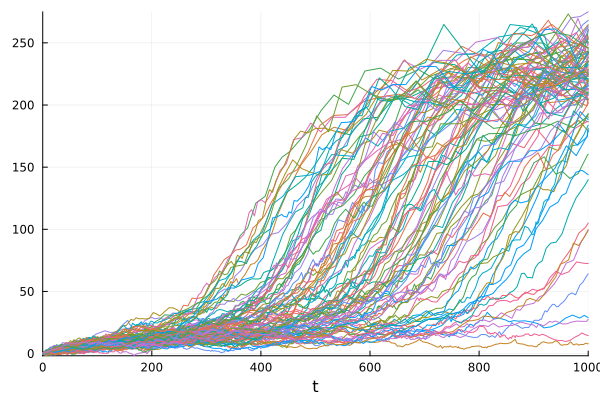

In [20]:
esol = solve(eprob; trajectories=100)
plot(esol)

Sometimes, when plotting multiple Monte Carlo trajectories, the `linealpha` argument (making trajectories more transparent) can be useful.

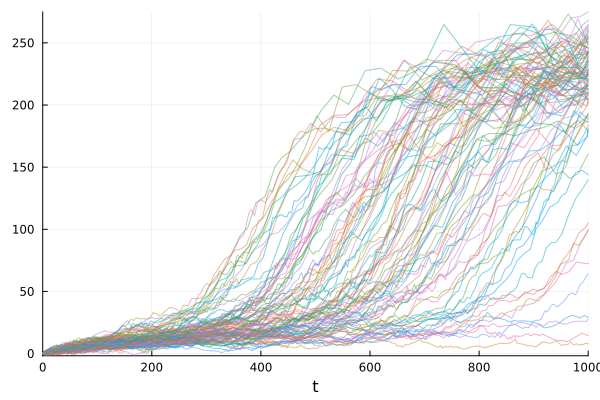

In [21]:
plot(esol; linealpha=0.5)

When simulating an `EnsembleProblem`, a ensemble algorithm can be chose (e.g. `EnsembleSerial()`, `EnsembleThreads()`, or `EnsembleGPUArray()`) to determine parallelisation strategy. By default `EnsembleThreads()` is used (best for problems where each individual simulation is quick).

Here, we use `EnsembleDistributed()` to parallelise over several processors.

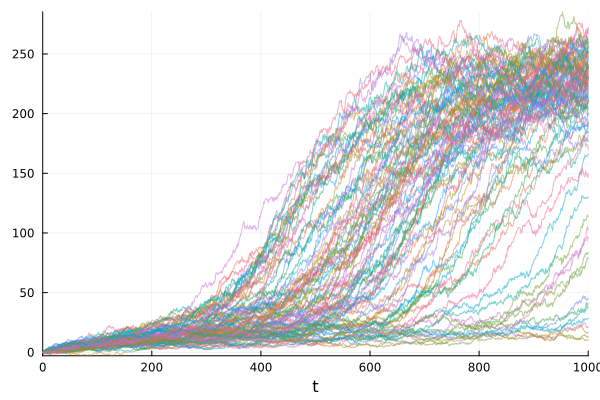

In [23]:
esol = solve(eprob, ImplicitEM(), EnsembleDistributed(); trajectories=100)
plot(esol; linealpha=0.5)

## Callback and event handling
Sometimes one wish to add events to a simulation. This can e.g. signify that and input is turned on, or that a certain amount of some species is added to the system. This is handled through callbacks. Callbacks couple a condition (for when the even happen) with an effect they have on the system. 

We will start by looking at a simple `PresetTimeCallback` (which happens at some fixed time points). We consider a simple degradation model, however, at certain time points some amount of `X` is added to teh system. We begin with creating our model and simulating it without a callback:

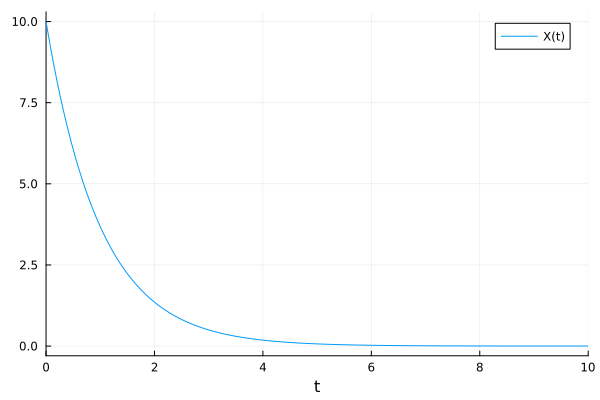

In [24]:
degradation_model = @reaction_network begin
    d, X --> 0
end

u0 = [:X => 10.0]
tspan = (0.0, 10.0)
p = [:d => 1.0]

oprob = ODEProblem(degradation_model, u0, tspan, p)
sol = solve(oprob)
plot(sol)

Next, we add a callback. The `affect!` function take a single argument, an `integrator`, which keeps track of the state of the model during the simulation. Parameter and species values can be indexed similarly as for solutions. Here, we add `5.0` units of `X`. We also make the callback fire at the timepoints `4.0` and `7.0` (the condition is a vector containing these values).

In [25]:
condition = [3.0, 7.0]
function affect!(integrator)
    integrator[:X] += 5.0
end
ps_cb = PresetTimeCallback(condition, affect!);

Finally, we can supply the callback to the solve command using the `callback` argument.

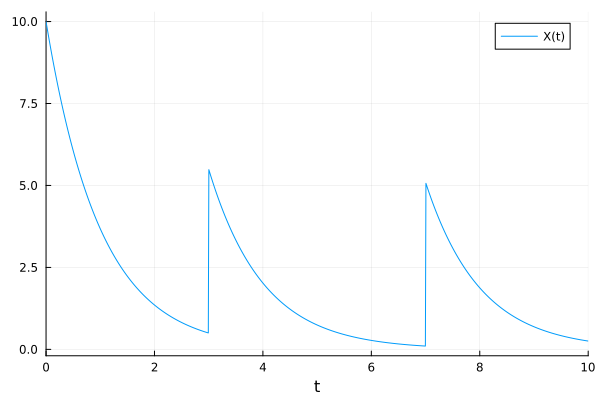

In [26]:
sol = solve(oprob; callback = ps_cb)
plot(sol)

More advanced callbacks (such as `DiscreteCallback`s and `ContinuousCallback`s) are also supported. These `condition`s are function, which allow them to trigger at more general points in time.